# Crack Detection Convolutional Neural Network (CNN) with Grad-CAM Visualization

Author: Megan Arnold

Date: September 30<sup>th</sup>, 2025

# Introduction

Convolutional Neural Networks enable feature identification in visual 2D datasets. This work by applying filters/kernels to the images to create a latent feature set. This latent feature set is then aggregated and applied to a classification network; thus enabling classification of images. The benefit of using Convolutional Neural Networks is that the filters/kernels are learned during training and have relatively small number of parameters compared to a fully connected network. This enables the network to learn features that are relevant to the classification task by initially learning low level features like edges and gradients and then building up to more complex features like shapes. The benefit of this type of network is that the location of the feature within the image isn't relevant, as the feature can be detected anywhere in the image. This is particularly useful for images where the object of interest can be in different locations within the image.

To apply this concept to a use case, I will be taking a dataset of images of concrete and trying to classify the images as either having a crack or not having a crack. The dataset comes from Kaggle’s crack identification dataset <sup>[1]</sup>. This dataset is balanced and has approximately 7500 cracked images and 7500 uncracked images. Below are two examples of the images in the dataset. One of an obvious crack, one of a less obvious crack, and an uncracked example.

Obvious Cracked Image:

<img src="data/train/1_cracked/14824.jpg" alt="Cracked Image" width="400" height="400"/>

Non-Obvious Cracked Image (crack diagonal from top left to bottom right):

<img src="data/train/1_cracked/318.jpg" alt="Cracked Image" width="400" height="400"/>

Uncracked Image:

<img src="data/train/0_uncracked/236.jpg" alt="Uncracked Image" width="400" height="400"/>

I chose this dataset because in certain industries, like manufacturing, construction and aerospace, being able to use computer vision to identify defects can increase the reliability of inspections and mitigate more expensive and potentially catastrophic repairs if a defect goes undetected. I chose to look into this subject because at my work, we are looking into using computer vision to identify defects in the Thermal Barrier Coating of turbine blades and vanes. The cracks in this coating looks very similar to the cracks in the Kaggle dataset. Being able to apply Convolutional Neural Networks to the visual inspection of deviated components will improve the reliability of inspection and subsequent repair and refurbishment of the components. Throughout this project, I will attempt to tie what I have done back to the industry requirements of inspection thermal barrier coating, as there are many parallels between this dataset and the proprietary dataset of coatings.


In this project, I will define an initial baseline architecture and attempt to improve upon it through hyperparameter tuning, architecture changes, and data augmentation. I will submit the classification predictions to Kaggle to get the results of the test dataset and report the results. 

Once the predictions are generated, I will summarize what I have learned by looking at what didn’t work well and what did improve the models. I will then talk about where future work can be applied to this project to improve the usability and capability of the model. 

Overall, I was able to achieve a model that was able to generalize well to the test dataset and, once a visualization technique was applied, was able to identify the crack in the image along with a heatmap of the areas of interest. I'll discuss the details in the relevant sections below.


# Table of Contents

1. Introduction
2. Table of Contents
3. Configure and Imports
4. Exploratory Data Analysis
    1. Sample Diverse Images
    2. Distribution of Pixels
5. Model Definition and Training
6. Baseline Model
7. HyperParameter Tuning Version 2
    1. Addressing the overfit issue
    2. GradCAM visualization and Results
8. HyperParameter Tuning Version 3
    1. GradCAM visualization and Results
9. Final Model with Data Augmentation
10. Results and Conclusion
11. Future Work
12. Discussion


# Configuration and Imports

I will be using the keras library to interact with the tensorflow api to build the Convolutional Neural Networks. Below is are the configurations to setup my environment and enable training on the GPU, along with setting the constants and paths for the project.


In [1]:

import os
import gc

os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true" 
os.environ["LD_LIBRARY_PATH"] = (
    "/usr/local/cuda/lib64:/usr/lib/x86_64-linux-gnu:"
    + os.environ.get("LD_LIBRARY_PATH", "")
)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
import tensorflow as tf
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)
        
tf.keras.backend.clear_session()
gc.collect()
import keras as k

print(k.__version__)

print(tf.config.list_physical_devices("GPU"))
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices("GPU")))
print(tf.config.list_physical_devices("GPU"))

2025-09-30 19:49:04.613888: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-09-30 19:49:04.614009: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-09-30 19:49:04.676447: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.15.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
2.15.0
Num GPUs Available:  1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [2]:
# Import libraries and dataset
import cv2
import gc
from io import StringIO
import itertools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import psutil
import sys
from tf_explain.core.grad_cam import GradCAM
import tensorflow as tf

# For 2D convolutional neural networks with keras
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    Dense,
    Dropout,
    BatchNormalization,
)
from keras.models import Sequential, load_model
from keras.optimizers import Adam, SGD
from keras.callbacks import EarlyStopping
from keras.datasets import mnist
from keras.utils import image_dataset_from_directory
from keras import mixed_precision


# Set the random seed for reproducibility
import random

SEED = 5
os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

mixed_precision.set_global_policy("float32")

from sklearn.model_selection import train_test_split


ROOT_DIR = os.getcwd()
DATA_DIR = ROOT_DIR + "/data/"
MODEL_DIR = ROOT_DIR + "/models/"
SUB_DIR = DATA_DIR + "/submissions/"

TRAIN_DIR_CRACKED = DATA_DIR + "train/1_cracked/"
TRAIN_DIR_UNCRACKED = DATA_DIR + "train/0_uncracked/"
TEST_DIR = DATA_DIR + "test/"
EXAMPLES_DIR = DATA_DIR + "examples_subset/"

TARGET_SIZE = (256, 256)
BATCH_SIZE = 16


# # Preprocessing to convert to domain of [0, 1]
# def preprocessing(x, y):
#     x = tf.cast(x, tf.float32)
#     # If the batch max > 1.5, we assume 0..255 and divide; else we leave as-is.
#     scale = tf.where(tf.reduce_max(x) > 1.5, 255.0, 1.0)
#     x = x / scale
#     return x, y


train_ds = image_dataset_from_directory(
    DATA_DIR + "train",
    labels="inferred",
    label_mode="binary",
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

val_ds = image_dataset_from_directory(
    DATA_DIR + "train",
    labels="inferred",
    label_mode="binary",
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=TARGET_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=tf.data.AUTOTUNE)


# verify class distribution between train and val dataset
def get_class_distribution(dataset):
    labels = []
    for _, y in dataset.unbatch():  # go through all samples, not batches
        labels.append(int(y.numpy()))
    labels = np.array(labels)
    unique, counts = np.unique(labels, return_counts=True)
    return dict(zip(unique, counts))


print("Train distribution:", get_class_distribution(train_ds))
print("Val distribution:", get_class_distribution(val_ds))


cracked_filenames = [
    "9584.jpg",
    "9662.jpg",
    "9872.jpg",
    "9992.jpg",
    "4622.jpg",
    "5281.jpg",
    "5795.jpg",
    "7049.jpg",
    "7773.jpg",
]
uncracked_filenames = [
    "14.jpg",
    "448.jpg",
    "1090.jpg",
    "1910.jpg",
    "5292.jpg",
    "5306.jpg",
    "5923.jpg",
    "6215.jpg",
    "7355.jpg",
]

example_labels = []
for fname in os.listdir(EXAMPLES_DIR):
    if not fname.endswith(".jpg"):
        continue
    if fname in cracked_filenames:
        example_labels.append(1)
    elif fname in uncracked_filenames:
        example_labels.append(0)
    else:
        raise ValueError(
            f"Filename {fname} not found in either cracked or uncracked lists."
        )
example_dataset = image_dataset_from_directory(
    directory=EXAMPLES_DIR, labels=example_labels, image_size=(256, 256), batch_size=32
)

# # assert image domain is [0,1]
# for x, y in train_ds.take(1):
#     print("Min:", tf.reduce_min(x).numpy(), "Max:", tf.reduce_max(x).numpy())   # should be 0.0 and 1.0

Found 14968 files belonging to 2 classes.
Using 11975 files for training.
Found 14968 files belonging to 2 classes.
Using 2993 files for validation.


/tmp/ipykernel_2656/1847546273.py:100: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  labels.append(int(y.numpy()))


Train distribution: {0: 5958, 1: 6017}
Val distribution: {0: 1509, 1: 1484}
Found 18 files belonging to 2 classes.


In [3]:
# HELPER FUNCTIONS

from matplotlib import colors as mcolors
def plot_history(history, metric="accuracy"):
    """
    Plot training and validation metrics over epochs.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(history.history[metric], label=f"Train {metric}", color="blue")
    plt.plot(history.history[f"val_{metric}"], label=f"Val {metric}", color="orange")
    plt.title(f"Model {metric} over epochs")
    plt.xlabel("Epochs")
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid()
    plt.show()


def load_model_and_history(model_name, model_dir=MODEL_DIR):
    """
    Load a Keras model and its training history from disk.
    """
    model_path = os.path.join(model_dir, f"{model_name}.h5")
    history_path = os.path.join(model_dir, f"{model_name}_history.pkl")

    if not os.path.exists(model_path):
        raise FileNotFoundError(f"Model file {model_path} does not exist.")

    model = load_model(model_path)

    if not os.path.exists(history_path):
        raise FileNotFoundError(f"History file {history_path} does not exist.")

    with open(history_path, "rb") as f:
        history = pickle.load(f)

    return model, history


def save_model_and_history(model, history, model_name, model_dir=MODEL_DIR):
    """
    Save a Keras model and its training history to disk.
    """
    model_path = os.path.join(model_dir, f"{model_name}.h5")
    if history:
        history_path = os.path.join(model_dir, f"{model_name}_history.pkl")
        with open(history_path, "wb") as f:
            pickle.dump(history.history, f)
    model_performance_path = os.path.join(model_dir, f"{model_name}_performance.txt")

    model.save(model_path)

    # Capture model summary
    summary_buffer = StringIO()
    model.summary(print_fn=lambda x: summary_buffer.write(x + "\n"))
    model_summary_str = summary_buffer.getvalue()
    summary_buffer.close()

    with open(model_performance_path, "w") as f:
        f.write(f"Model Name: {model_name}\n")
        f.write(f"Input Shape: {model.input_shape[1:]}\n")
        f.write(f"Total Parameters: {model.count_params() // 1000}K\n")
        f.write(f"Optimizer: Adam\n")
        f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
        f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
        f.write("Model Summary:\n")
        f.write(model_summary_str)

    print(f"Model and history saved as {model_name}.")



def get_test_predictions_df(model, test_dataset, threshold=0.5, batch_size=32):
    """
    Generate binary predictions for the test dataset using the provided model.
    Returns a pandas DataFrame with columns 'filename' and 'class' as expected for Kaggle.
    """
    predictions = []
    image_files = test_dataset.file_paths

    for batch in test_dataset:
        preds = model.predict(batch)
        preds_binary = (preds >= threshold).astype(int).flatten()
        predictions.extend(preds_binary)

    df = pd.DataFrame({
        'filename': [os.path.basename(path) for path in image_files],
        'class': ['cracked' if pred == 1 else 'uncracked' for pred in predictions]
    })

    return df




def plot_grad_cam(path, model, layer_name=None, target_size=(256, 256),verbose=False):
    """Plots the GradCAM vizualization for an image and given model. Identifies the last conv2d layer if necessary.
    Reference tutorial with code: [3] [5]
    """
    img = tf.keras.utils.load_img(path, target_size=target_size)
    x = tf.keras.utils.img_to_array(img).astype("float32")
    x = tf.expand_dims(x, 0)

    if layer_name is None:
        conv_names = [
            l.name for l in model.layers if isinstance(l, tf.keras.layers.Conv2D)
        ]
        if not conv_names:
            raise ValueError("No Conv2D layers found.")
        layer_name = conv_names[-1]

    conv_out_layer = model.get_layer(layer_name).output # Last convolutional layer to visualize original 2d features
    prob_layer = model.layers[-1].output # final output layer to understand probabilities
    grad_model = tf.keras.Model(model.inputs, [conv_out_layer, prob_layer]) # get model and keep track of important layers

    with tf.GradientTape() as tape:
        conv_out, prob = grad_model(x, training=False)  # conv_out: (1,H,W,last conv layer count), prob: (1,1)
        p = tf.clip_by_value(prob, 1e-6, 1.0 - 1e-6) # avoid log(0)
        logit = tf.math.log(p) - tf.math.log(1.0 - p) # standard logit function
        target = tf.where(p >= 0.5, logit, -logit)[:, 0] # Classification

    if verbose:
        print("prob:", prob.numpy().ravel())
        print("logit:", logit.numpy().ravel())
        print("target:", target.numpy().ravel())
        print("conv_out shape:", conv_out.shape,
            "min:", float(tf.reduce_min(conv_out)),
            "max:", float(tf.reduce_max(conv_out)),
            "mean:", float(tf.reduce_mean(conv_out)))

    grads = tape.gradient(target, conv_out)[0] # (H,W,C) of gradients of last layer
    if verbose:
        print("grads shape:", grads.shape,
            "min:", float(tf.reduce_min(grads)),
            "max:", float(tf.reduce_max(grads)),
            "mean:", float(tf.reduce_mean(grads)),
            "abs mean:", float(tf.reduce_mean(tf.abs(grads))))

    weights = tf.reduce_mean(grads, axis=(0, 1)) # average weights for each conv2d channel
    if verbose:
        print("weights shape:", weights.shape,
            "first 5:", weights[:5].numpy())

    cam = tf.reduce_sum(conv_out[0] * weights, axis=-1) # cam value before relu and normalization
    if verbose:
        print("raw cam shape:", cam.shape,
            "min:", float(tf.reduce_min(cam)),
            "max:", float(tf.reduce_max(cam)),
        "mean:", float(tf.reduce_mean(cam)))

    cam = tf.nn.relu(cam) # Only show positive evidence
    if verbose:
        print("relu cam min/max:", float(tf.reduce_min(cam)), float(tf.reduce_max(cam)))

    cam = cam / (tf.reduce_max(cam) + 1e-8) # normalize to [0, 1]
    if verbose:
        print("normalized cam min/max:", float(tf.reduce_min(cam)), float(tf.reduce_max(cam)))

    cam = tf.image.resize(cam[..., None], target_size)[..., 0].numpy() # resize to original image size for overlay. could cause blown out pixels?
    if verbose:
        print("resized cam shape:", cam.shape,
            "dtype:", cam.dtype,
            "min:", cam.min(), "max:", cam.max(), "mean:", cam.mean())

    # Struggled with visualizations when the model was very confident (prob near 0 or 1)
    # Heuristic solution... FIXME # Play with the tf.nn.relu. despite this being in the orignal paper, it seems to be messing with the images as a signficiant portion of the probabilities are fro negative evidence
    cam_min = cam.min()
    cam_max = cam.max()
    cam_avg = cam.mean()
    
    cam_range = cam_max - cam_min
    if cam_range < 1e-4 or cam_avg < 0.27:
        cam_inv = cam
    else:
        cam_inv = 1 - cam
    #cam_inv = 1 - cam
    if verbose:
        print("cam_inv min/max:", cam_inv.min(), cam_inv.max())
        print("cam_avg:", cam_avg)



    vis = (x[0] / 255.0).numpy()
    heatmap = cv2.applyColorMap((cam_inv * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = np.clip(0.4 * heatmap / 255.0 + vis, 0, 1)


    print(f"Path: {path}")
    print(f"Prob: {float(prob.numpy()[0,0]):.8f}")
    

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(vis)
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 3, 2)
    plt.imshow(cam_inv, cmap="jet", vmin=0, vmax=1)
    plt.title("Grad-CAM")
    plt.axis("off")
    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis("off")
    plt.show()

# Exploratory Data Analysis (EDA)

In the Exploreatory Data Analysis section, I will get a better understanding of the dataset itself through sample images, the shape of the images, the balance of the labels to determine what metrics to use, and the pixel distribution within the dataset to identify any anomolies. 

The images have 3 color channels and are all 256x256 pixels. This means that I can define the input shape to the neural network without having to do any preprocessing. All the rescaling can happen within the network itself. This isn’t probable for data scraped from the internet, but if you have control over the image generation, then this is feasible. For the use of this in an inspection workflow, the cameras and resolution would be well defined and consistent.

The label distribution is 7501 cracked images and 7467 uncracked images. Because of this, I will use accuracy as the validation metric. In the practice, it would make sense that false positives are much less damaging than false negatives. Because of this, when training on real, most likely unbalanced data, recall would be the preferred metric. From my experience in manufacturing, when a turbine blade has been ran for the set interval of operations, almost every single blade and vane has cracking in the coating, as the blade will distort when seeing the very high temperatures for long periods of time. The blade will creep and the base metal and coating have different thermal expansion properties. 

When looking at the individual pixel distributions, there were no significant differences between the cracked and uncracked dataset. Because of this, I don’t expect the model to learn shortcuts in the data. An example would be, if the uncracked images were brighter, the model could just learn the difference between bright and dark images and perform well on the classification task; however, this model would be worse than worthless in practice. 

Overall, the data shapes are consistent, the dataset is balanced, and the images have similar pixel distributions. I will define the baseline CNN next.



#### Label Distribution

The labels are balanced at about 7500 per cracked and uncracked images. In addition to this, the shapes are all the same at 3 color channels and 256 pixels by 256 pixels. This will enable easier preprocessing and use of metrics like accuracy.

In [80]:
# verify image size
file_path = f"{EXAMPLES_DIR}14.jpg"
img = cv2.imread(file_path)
print(f"Image shape: {img.shape}")  # Should print (256, 256, 3)    

# Distribution of the labels in the training dataset
print(f"Count of cracked images: {len(os.listdir(TRAIN_DIR_CRACKED))}")
print(f"Count of non-cracked images: {len(os.listdir(TRAIN_DIR_UNCRACKED))}")
print(f"Percent of cracked images: {len(os.listdir(TRAIN_DIR_CRACKED)) / (len(os.listdir(TRAIN_DIR_CRACKED)) + len(os.listdir(TRAIN_DIR_UNCRACKED))) * 100:.2f}%")

Image shape: (256, 256, 3)
Count of cracked images: 7501
Count of non-cracked images: 7467
Percent of cracked images: 50.11%


## Sample Diverse Images

Below are some sample images of the dataset. We can see that the top images have cracks in the concrete and the bottom images don’t have cracks. A potential concern is that a lot of the uncracked images have visible craters. I will attempt to use GradCAM visualization techniques on the predicted images to determine what features are being strongly considered in the classification task. If there is too much emphasis placed on something like a crater, then I will have to rethink my approach and potentially preprocessing of the images

In [50]:
# Verify data range of train dataset
for images, labels in train_dataset.take(1):
    print(f"Image batch shape: {images.shape}")
    print(f"Label batch shape: {labels.shape}")
    print(f"Image pixel range: min {tf.reduce_min(images).numpy()}, max {tf.reduce_max(images).numpy()}")

2025-09-20 17:08:08.271841: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 12582976 bytes after encountering the first element of size 12582976 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


Image batch shape: (16, 256, 256, 3)
Label batch shape: (16,)
Image pixel range: min 0.0, max 1.0


2025-09-20 17:08:09.295146: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 12582976 bytes after encountering the first element of size 12582976 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


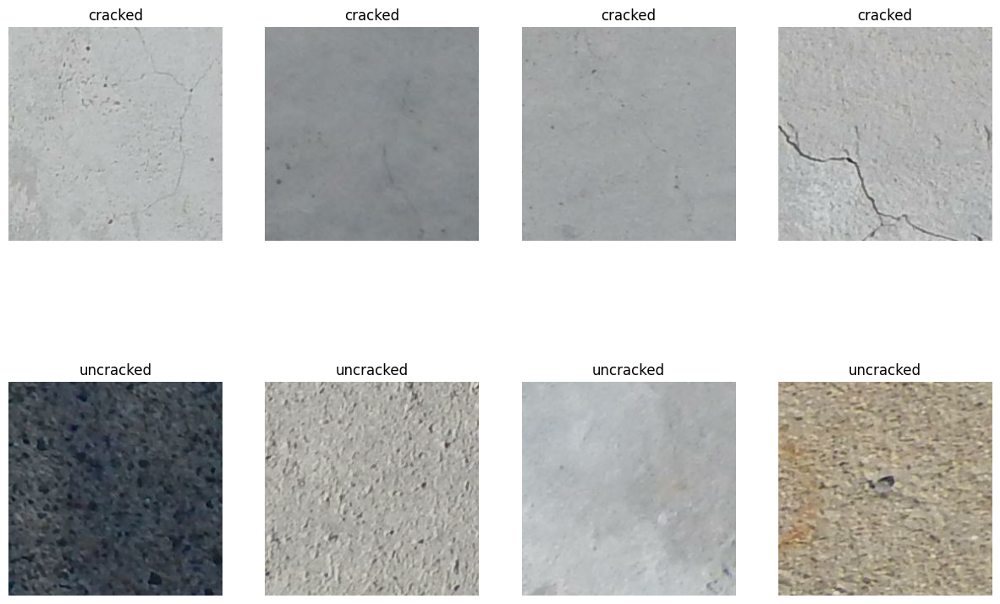

In [51]:
# plot examples of cracked and uncracked images
plt.figure(figsize=(15, 10))
for image, labels in example_dataset.take(1).as_numpy_iterator():
    sorted_indices = np.argsort(labels)
    image = image[sorted_indices]
    labels = labels[sorted_indices]
    for i in range(len(image)):
        ax = plt.subplot(2, 4, i + 1)
        plt.imshow(image[i].astype("uint8"))
        plt.title(labels[i].decode("UTF-8"))
        plt.axis("off")


## Distribution of pixels

For the pixel distribution, there don’t seem to be differences between the cracked and uncracked images. This is ideal as it will reduce the probability that the model learns a confounding factor for the labels instead of the actual feature of interest. I will go to the model definition and training as the data is not prepared for that.


In [41]:
# RGB histograms of cracked dataset
bin_count = int(np.ceil(256/8))
red_count_c = np.zeros(bin_count)
green_count_c = np.zeros(bin_count)
blue_count_c = np.zeros(bin_count)
red_count_u = np.zeros(bin_count)
green_count_u = np.zeros(bin_count)
blue_count_u = np.zeros(bin_count)
min_range = 0
max_range = 0
for images, labels in train_ds:
    # iterate over batch
    for img, label in zip(images, labels):
        label = int(label.numpy())
        img = tf.cast(img, tf.int32).numpy() 

        r_vals = img[:,:,0].flatten()
        g_vals = img[:,:,1].flatten()
        b_vals = img[:,:,2].flatten()

        if label == 1:  # uncracked
            red_count_u += np.histogram(r_vals, bins=bin_count, range=(0,256))[0]
            green_count_u += np.histogram(g_vals, bins=bin_count, range=(0,256))[0]
            blue_count_u  += np.histogram(b_vals, bins=bin_count, range=(0,256))[0]
        else:           # cracked
            red_count_c   += np.histogram(r_vals, bins=bin_count, range=(0,256))[0]
            green_count_c += np.histogram(g_vals, bins=bin_count, range=(0,256))[0]
            blue_count_c  += np.histogram(b_vals, bins=bin_count, range=(0,256))[0]



/tmp/ipykernel_110197/2760809985.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  label = int(label.numpy())


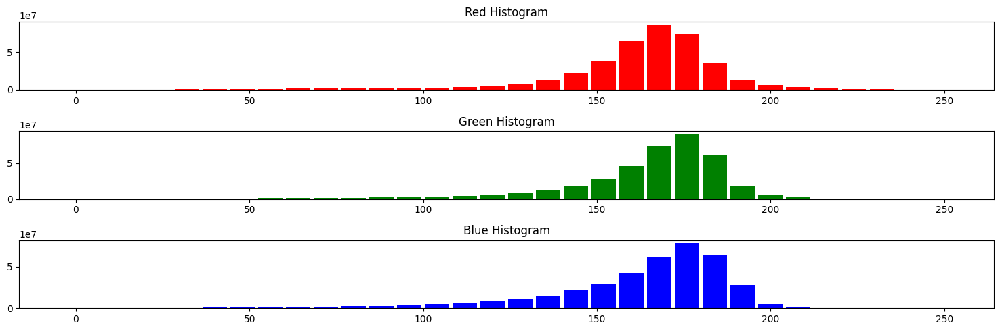

In [42]:
# Cracked Histograms
plt.figure(figsize=(15, 5))
plt.subplot(3, 1, 1)
plt.bar(np.arange(bin_count)*8, red_count_c, color='red', width=7)
plt.title('Red Histogram')
plt.subplot(3, 1, 2)
plt.bar(np.arange(bin_count)*8, green_count_c, color='green', width=7)
plt.title('Green Histogram')
plt.subplot(3, 1, 3)
plt.bar(np.arange(bin_count)*8, blue_count_c, color='blue', width=7)
plt.title('Blue Histogram')
plt.tight_layout()
plt.show()

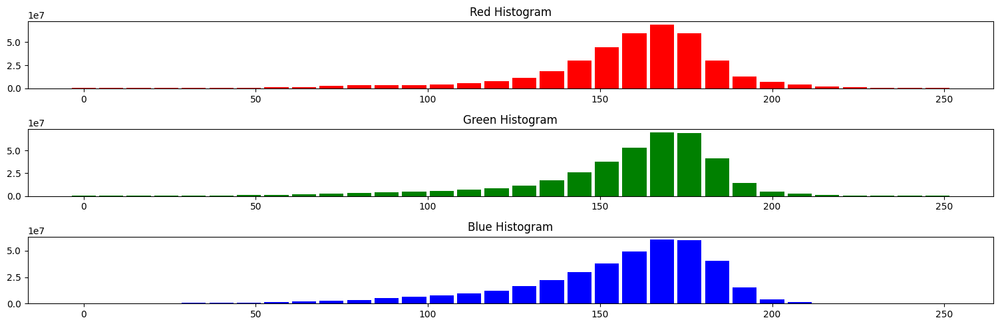

In [43]:
# Photo Histograms
plt.figure(figsize=(15, 5))
plt.subplot(3, 1, 1)
plt.bar(np.arange(bin_count)*8, red_count_u, color='red', width=7)
plt.title('Red Histogram')
plt.subplot(3, 1, 2)
plt.bar(np.arange(bin_count)*8, green_count_u, color='green', width=7)
plt.title('Green Histogram')
plt.subplot(3, 1, 3)
plt.bar(np.arange(bin_count)*8, blue_count_u, color='blue', width=7)
plt.title('Blue Histogram')
plt.tight_layout()
plt.show()

# Model Definition and Training

In this section, I will split up the datasets into a training and validation set from the Kaggle training dataset. I will use tensorflow datasets so that I can efficiently train on all images, not having to use a subset due to RAM limitations. The train set samples size is about 12000 with a validation of 3000 images. During the training, each epoch will use the validation dataset to determine if the model is overfitting and cut the model short if the model is overfitting too much. I will plot this epoch history of the training and validation set after each model.  Once the model is trained, I will get the submission results from the test dataset and report the results in the final results section and discuss sections.  

## Baseline Model

Below is a baseline model with 7 sets of convolutional layers with 32, 32, 64, 64, 128, 128, 256 filters. The architectures has batch normalization between the odd and even layers and max pooling between the sets of layers. For the activation functions, I will use ReLU, as it is a good baseline for most CNN architectures as it is computationally efficient and helps to avid the vanishing gradient problem.

Before the classification section, I use GlobalAveragePooling to aggregate everything from the convolutional network before it gets passed to the classification head. Because I wanted an explainable model, I needed an 2D aggregate after the convolution network to analyze the individual values of the pixels. The gradient is then measured to determine how critical this individual pixel is on the final classification. This method is better explained in the original paper, "Grad-CAM: Visual Explanations from Deep networks via Gradient-based Localization"<sup>[4]</sup>. I also found the article "Grad-CAM: A Gradient-based Approach to Explainability in Deep Learning"<sup>[2]</sup> an approchable article to understand what is required in this algorithm. I then convert that into a heatmap to help improve the explainability of these neural networks. Because of the explainability aspect of this, I maintain the Global Average Pooling throughout all my models; however, I change up the classification and convolutional architecture and parameters. 

The final set of layers is the binary classification task. The backend model consists of a drop out layer, fully connected dense layer with 64 neurons, and a final sigmoid node to get the probability of the classification for a binary task. Notice that there isn’t anything spatial in the classification, like bounding boxes, just the binary output.

I will train this baseline model and visualize the classification on a sample set of images. I will then use this information to identify issues with the architecture and create additional models with varying architectures and parameters.

Overall, I see two issues that I will attempt to address in the next version of the model.
Craters being highlighted as important features
Only small features are identified as important for the classification. I need to create a model that is capable of extrapolating and generalizing better

After submitting the results to Kaggle, these are the metrics for accuracy:

| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
| Model Baseline| ~0.85 | 0.780 | 0.773 |


In [ ]:
# Define simple CNN model
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    Rescaling,
)
from keras.regularizers import l2

baseline_model = Sequential(
    [
        # Conv2D(16, (3, 3), padding="valid", activation="relu", input_shape=(256, 256, 3)),
        # BatchNormalization(),
        # Conv2D(16, (3, 3), padding="same", activation="relu", ),
        # MaxPooling2D((2, 2)),
        Rescaling(1.0 / 255, input_shape=(256, 256, 3)),  #
        Conv2D(
            32, (3, 3), padding="same", activation="relu", input_shape=(256, 256, 3)
        ),
        BatchNormalization(),
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding="same", activation="relu"),
        # MaxPooling2D((2, 2)),
        Conv2D(256, (3, 3), padding="same", activation="relu"),
        ### Classification layers
        GlobalAveragePooling2D(),
        Dropout(0.3),
        Dense(64, activation="relu"), 
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

# Compile the model
from keras.optimizers import Adam, SGD

baseline_model.compile(
    optimizer=Adam(),  # SGD(learning_rate=0.001, momentum=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
baseline_model.summary()

# checkpoint manager
CHECKPOINT_DIR = MODEL_DIR + "checkpoints/"
checkpoint = tf.train.Checkpoint(
    baseline_model=baseline_model,
)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 256, 256, 32)      128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      1

### Train the model

In [ ]:
# Trian on subset of training data
history = baseline_model.fit(
    train_ds,
    epochs=50, 
    batch_size=16,
    validation_data=val_ds,
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)


##### Model Evaluation Plot

Below is a plot of the accuracy for the training and validation sets over the epochs. The model was trained for 50 epochs, but stopped early due to overfitting on the training dataset. The validation accuracy is about 0.85, which I will use as the baseline to compare against the future architecture changes and parameter changes.

With this baseline model, I decided to use Grad-CAM to visualize the model's predictions. The Grad-CAM technique identifies the most important parts of the Global Average Pooling Layer's output for the classification task. I am then able to overlay a heatmap on the original image to identify which of the images features were most important for the classification task with the given architecture.

With this new information. I will the make changes to the architecture to address the deficiencies of the model.

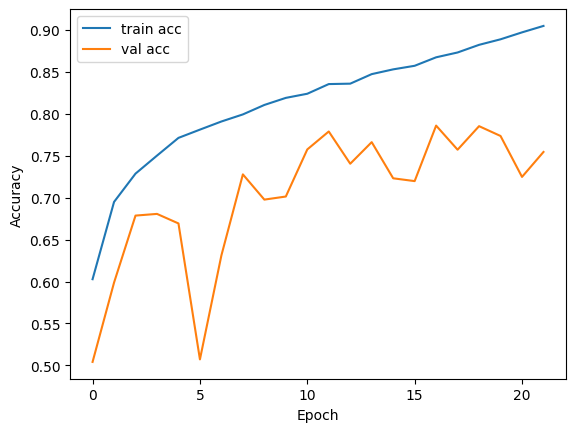

In [7]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [8]:
# Save the model
model_name = "Baseline_CNN_SGD"
print(f"Model Name: {model_name}")
baseline_model.save(f"{MODEL_DIR}{model_name}.h5")

import pickle

with open(f"{MODEL_DIR}{model_name}_history.pkl", "wb") as f:
    pickle.dump(history.history, f)

# Capture model summary
summary_buffer = StringIO()
baseline_model.summary(print_fn=lambda x: summary_buffer.write(x + '\n'))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {baseline_model.input_shape[1:]}\n")
    f.write(f"Total Parameters: {baseline_model.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: Baseline_CNN_SGD


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


#### GradCAM Visualization of Baseline Model

Overall, I see two issues that I will attempt to address in the next version of the model.
1. Craters being highlighted as important features
2. Only small features are identified as important for the classification. I need to create a model that is capable of extrapolating and generalizing better

Taking this knowledge, I will build a version 2 model in the next section to attempt to address these challenges




Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9992.jpg
Prob: 0.26483420


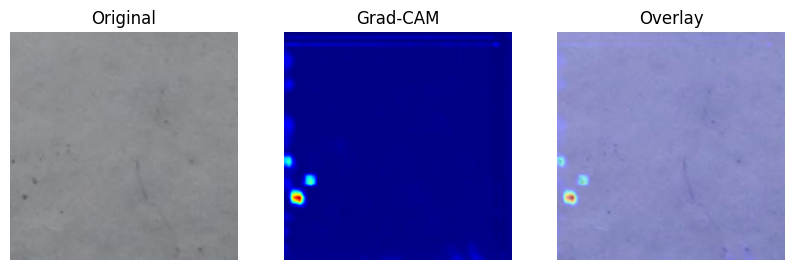

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/14.jpg
Prob: 0.32753012


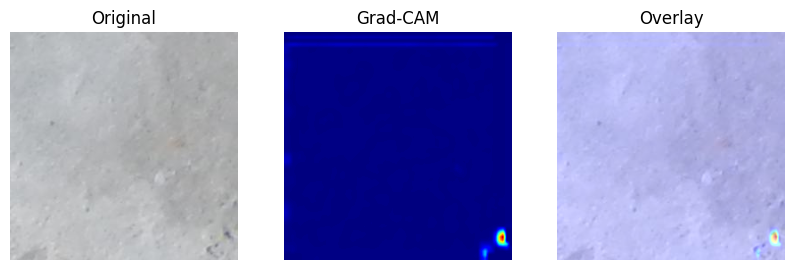

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5795.jpg
Prob: 1.00000000


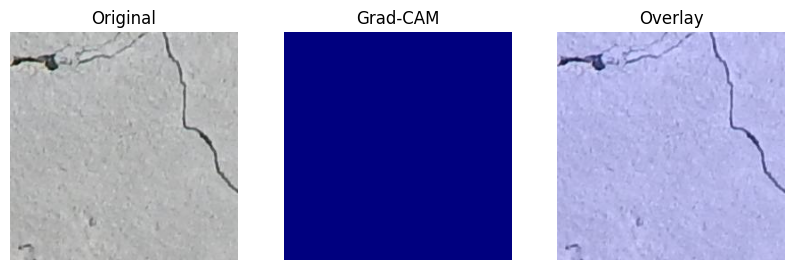

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1910.jpg
Prob: 0.56079197


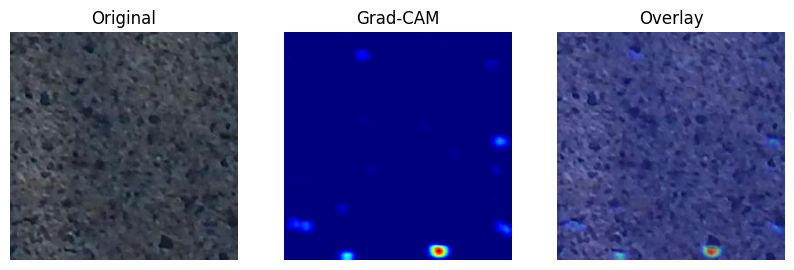

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/6215.jpg
Prob: 0.12290031


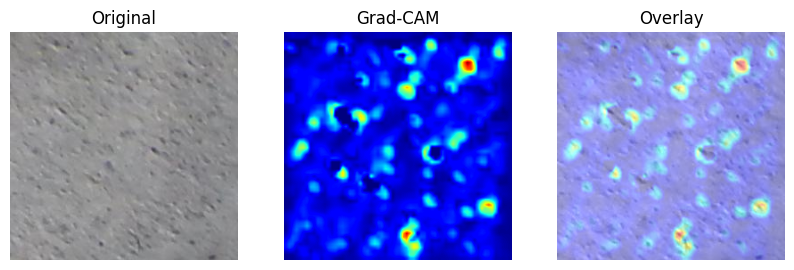

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5306.jpg
Prob: 0.26343355


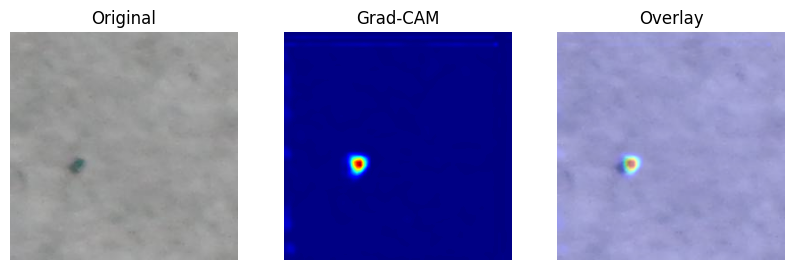

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5281.jpg
Prob: 0.99999952


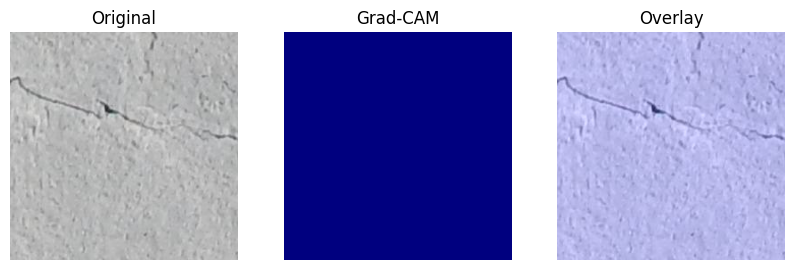

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1090.jpg
Prob: 0.04743223


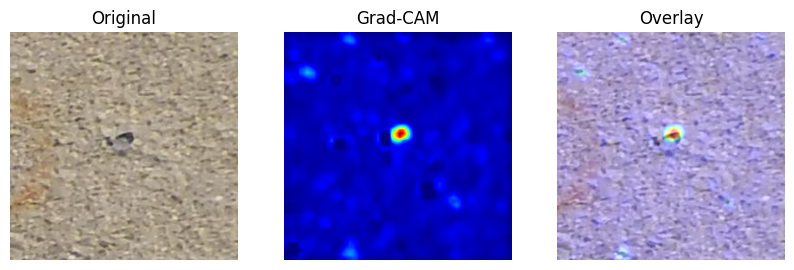

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5923.jpg
Prob: 0.22285888


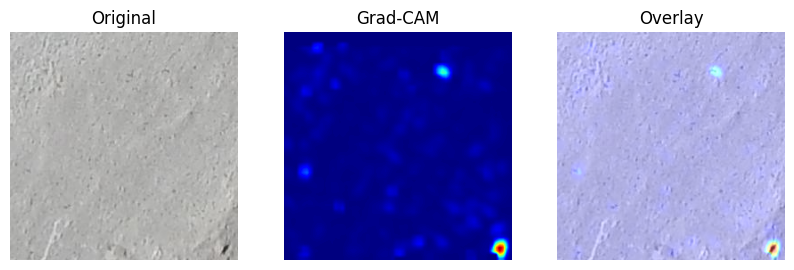

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5292.jpg
Prob: 0.21832037


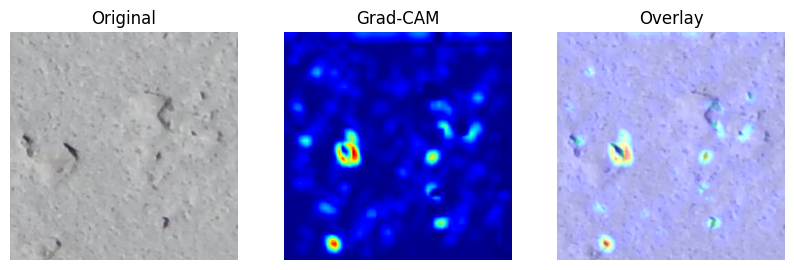

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/4622.jpg
Prob: 0.99999857


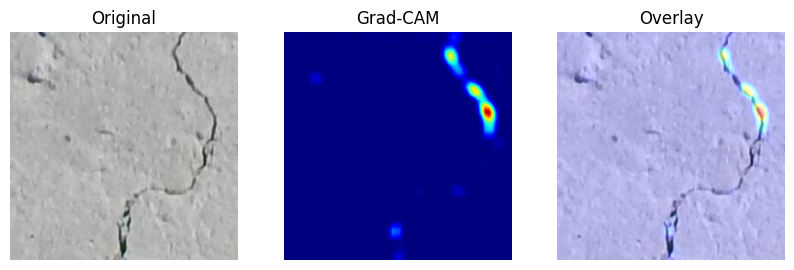

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/448.jpg
Prob: 0.09679984


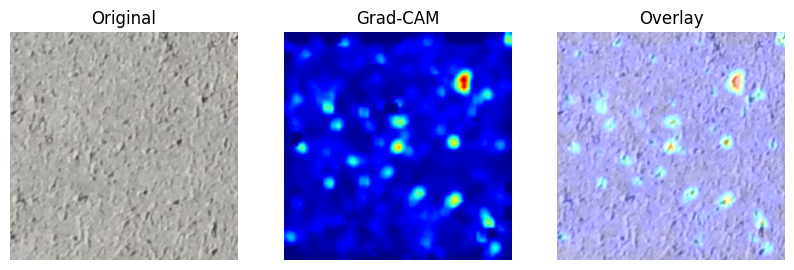

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7773.jpg
Prob: 0.99997830


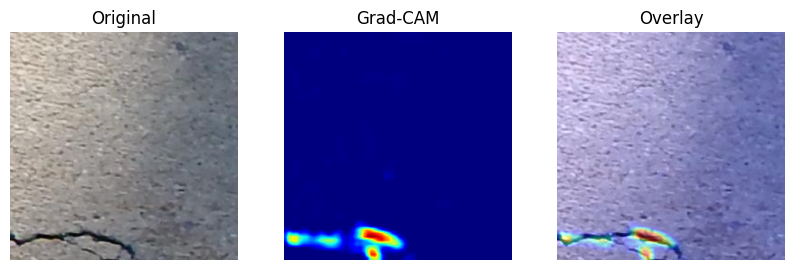

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9872.jpg
Prob: 0.69030547


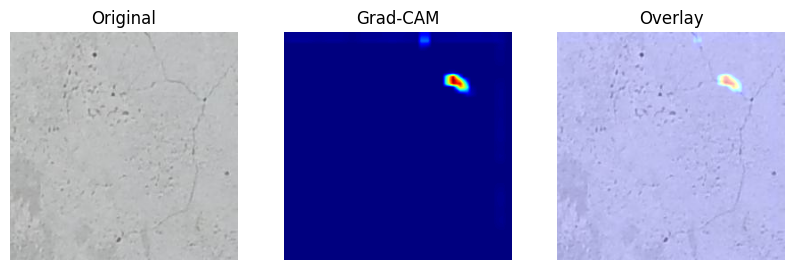

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7355.jpg
Prob: 0.27845544


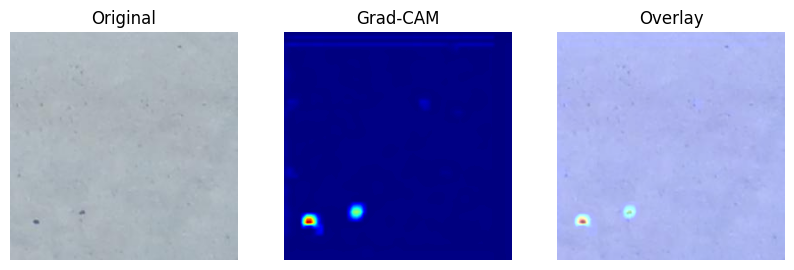

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9584.jpg
Prob: 1.00000000


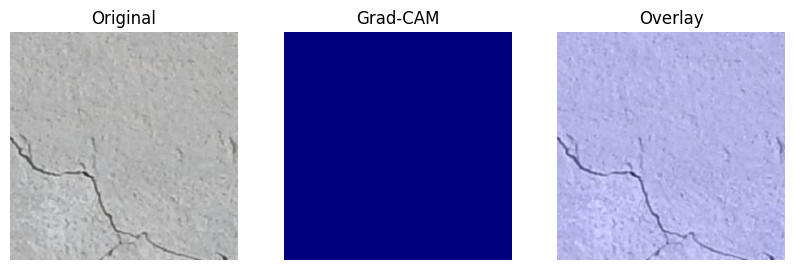

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9662.jpg
Prob: 0.39786273


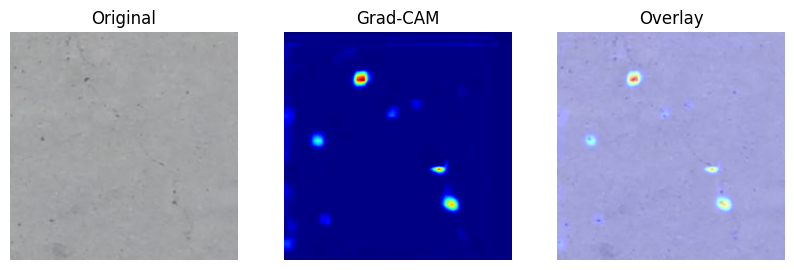

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7049.jpg
Prob: 0.99999714


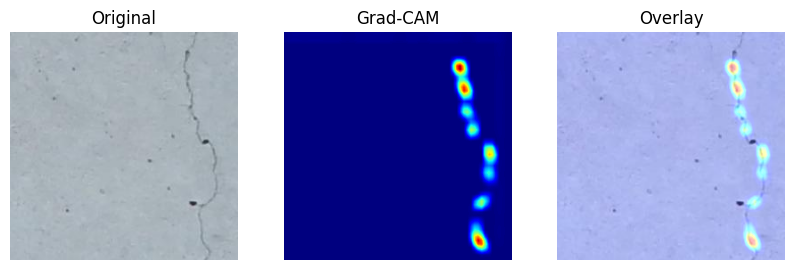

In [7]:
model_name = "Baseline_CNN_SGD"
model = load_model(f"{MODEL_DIR}{model_name}.h5")
TARGET_SIZE = (256, 256)


for example_path in os.listdir(EXAMPLES_DIR):
    plot_grad_cam(EXAMPLES_DIR + example_path, model, target_size=TARGET_SIZE, verbose=False)

# HyperParameter Tuning

Because I was able to get GradCAM<sup>[2]</sup> working and make the model explainable, I was able to identify two issues that I want to begin addressing. I used GradCAM to visualize the activation and overlay that heatmap with the original image that was classified. 

In the baseline model, we can see that what I anticipated about the craters occurred. There are many crater highlights instead of full line crack highlights. This model seems very focused on the details of the images, like individual craters, or single aspects of a crack, despite the crack traversing the entire image. 

The previous baseline model also had an issue with overfitting during training. I think this is because there wasn’t sufficient context of large cracks and it was overfitting on the previously seen data and not able to sufficiently generalize. 


## Addressing the overfitting issue

I tried to improve the overfitting issue of the first model by making only a few adjustments. Those adjustments were:
- Decrease Dense classification layer from 64 to 16
    - Address the overfitting
- Increase the dropout before the classification
    - Address the overfitting
- Added Dialation rate of 2 to the final convolutional layer
    - Attempt to add more context to the final features and enable full crack identification
- Changed first layer padding from same to valid
    - Attempt to allow th emodel to learn more contextual information early instead of focusing on the minor issues

I will talk about the results versus the expectations in the GradCam visualization section for this model



In [16]:
# Define simple CNN model
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    BatchNormalization,
    Dense,
    Dropout,
    GlobalAveragePooling2D,
    Rescaling,
)
from keras.regularizers import l2

model_V2 = Sequential(
    [
        Rescaling(1.0 / 255, input_shape=(256, 256, 3)),  #
        # Convolutional layers for image feature extraction
        Conv2D(
            32,
            (3, 3),
            padding="valid",  # Changed to valid from same to reduce edge artifacts
            activation="relu",
            input_shape=(256, 256, 3),
            # kernel_regularizer=l2(0.01),
        ),  # increased L2 regularization
        BatchNormalization(),
        Dropout(0.2),  # new dropout layer to help prevent overfitting
        Conv2D(32, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(
            64,
            (3, 3),
            padding="same",
            activation="relu",
            # kernel_regularizer=l2(0.01),
        ),
        BatchNormalization(),
        Dropout(0.2),  # new dropout layer to help prevent overfitting
        Conv2D(64, (3, 3), padding="same", activation="relu"),
        MaxPooling2D((2, 2)),
        Conv2D(
            128,
            (3, 3),
            padding="same",
            activation="relu",
            dilation_rate=(2, 2,),  # added dialation to help with contextualizing large cracks
            # kernel_regularizer=l2(0.01),
        ),
        BatchNormalization(),
        Conv2D(128, (3, 3), padding="same", activation="relu", dilation_rate=(2, 2)),
        Conv2D(256, (3, 3), padding="same", activation="relu"),
        ### Classification layers
        GlobalAveragePooling2D(),
        Dropout(0.4),  # increased dropout rate to help prevent overfitting
        Dense(16, activation="relu"),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

# Compile the model
from keras.optimizers import Adam, SGD

model_V2.compile(
    optimizer=SGD(learning_rate=0.001, momentum=0.9),
    loss="binary_crossentropy",
    metrics=["accuracy"],
)
model_V2.summary()

# checkpoint manager
CHECKPOINT_DIR = MODEL_DIR + "checkpoints/"
checkpoint = tf.train.Checkpoint(
    baseline_model=baseline_model,
    model_V2=model_V2,
)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_7 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 batch_normalization_3 (Bat  (None, 254, 254, 32)      128       
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, 254, 254, 32)      0         
                                                                 
 conv2d_8 (Conv2D)           (None, 254, 254, 32)      9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                 

In [ ]:
# Train on subset of training data
history = model_V2.fit(
    train_ds,
    epochs=50, 
    batch_size=16,
    validation_data=val_ds,
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)


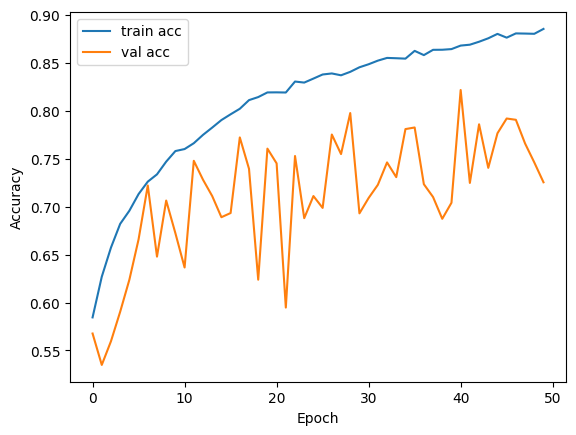

In [19]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [20]:
# Save the model
model_name = "Model_V2_CNN_SGD"
print(f"Model Name: {model_name}")
model_V2.save(f"{MODEL_DIR}{model_name}.h5")

import pickle

with open(f"{MODEL_DIR}{model_name}_history.pkl", "wb") as f:
    pickle.dump(history.history, f)

# Capture model summary
summary_buffer = StringIO()
model_V2.summary(print_fn=lambda x: summary_buffer.write(x + '\n'))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {model_V2.input_shape[1:]}\n")
    f.write(f"Total Parameters: {model_V2.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: Model_V2_CNN_SGD


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Grad-CAM Evaluation and Results

This model didn’t perform very well at all. Not only did it not learn more global contextual information for the cracks, it still highlighted the craters instead of the cracks as important features. It also had edge artifacts, most likely from the valid layer. And when it did find a crack, it only highlighted small aspects of the crack instead of the overall crack.

Going into the third model, I will attempt to continue correction on the baseline as that is still the model to beat. The results up until this point are below:

| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
| Model Baseline| ~0.85 | 0.780 | 0.773 |
|Version 2 | ~0.85 | 0.721 | 0.699 |


Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9992.jpg
Prob: 0.11734703


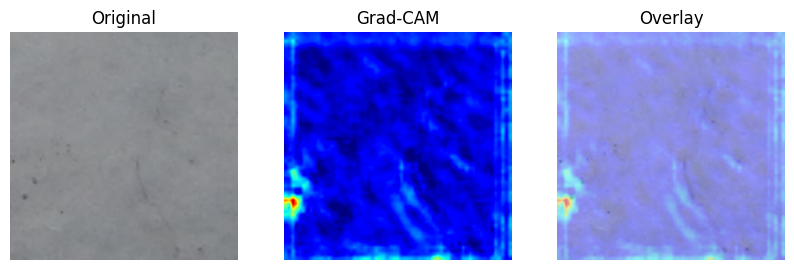

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/14.jpg
Prob: 0.32978037


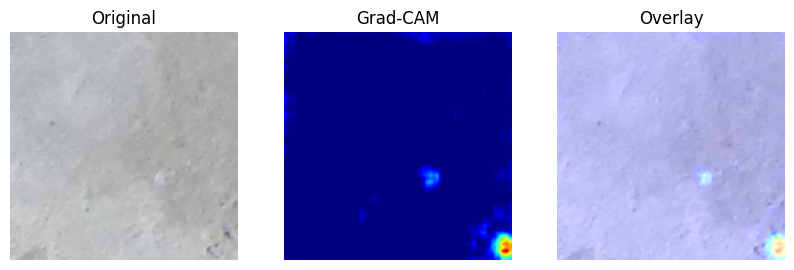

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5795.jpg
Prob: 0.99999928


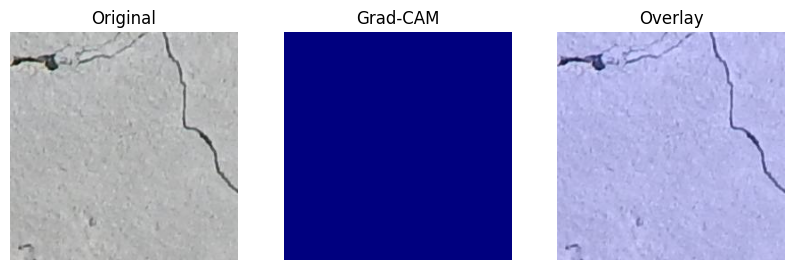

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1910.jpg
Prob: 0.24742593


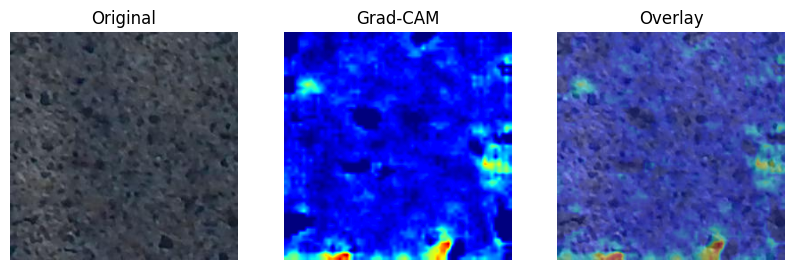

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/6215.jpg
Prob: 0.04084106


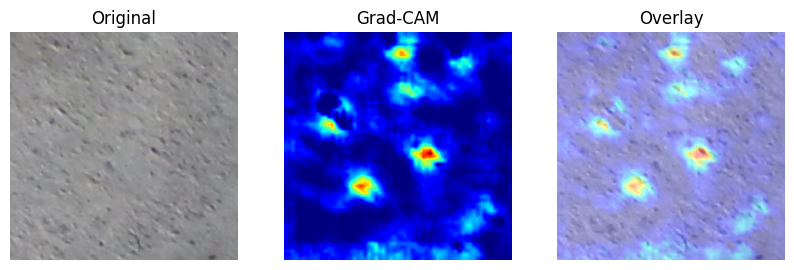

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5306.jpg
Prob: 0.09310434


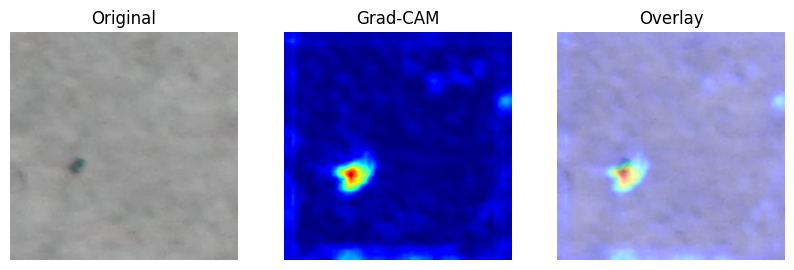

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5281.jpg
Prob: 0.99913472


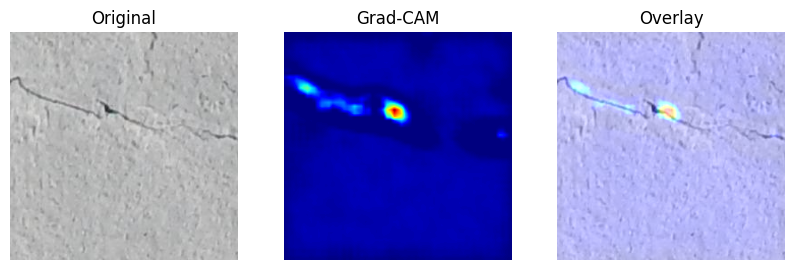

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1090.jpg
Prob: 0.07123566


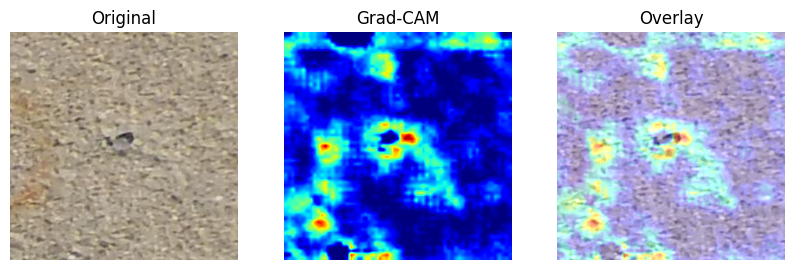

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5923.jpg
Prob: 0.36491561


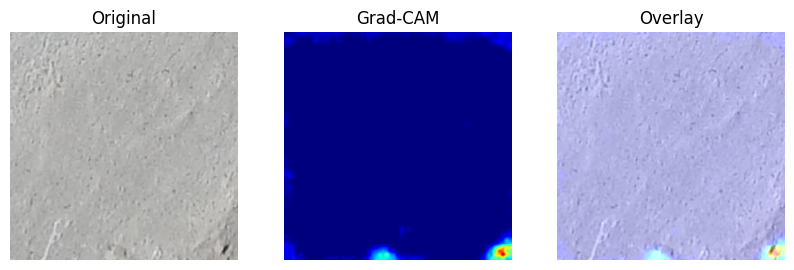

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5292.jpg
Prob: 0.21517237


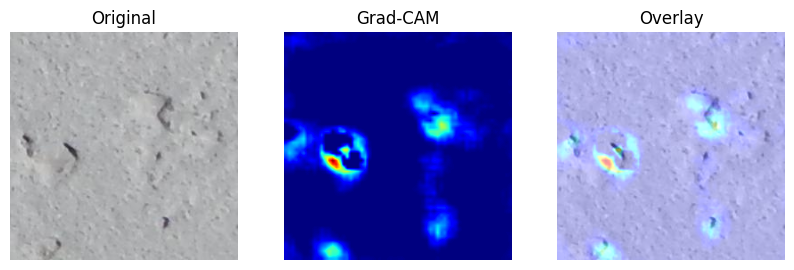

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/4622.jpg
Prob: 0.99883491


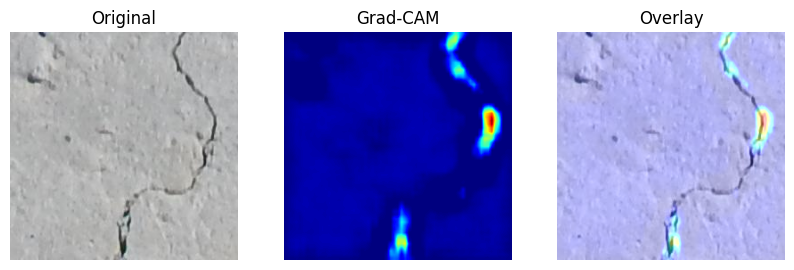

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/448.jpg
Prob: 0.14391066


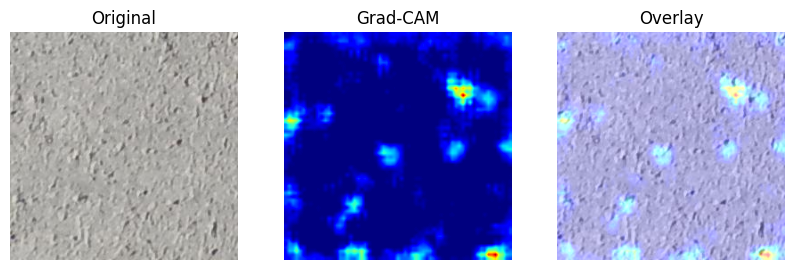

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7773.jpg
Prob: 0.99979275


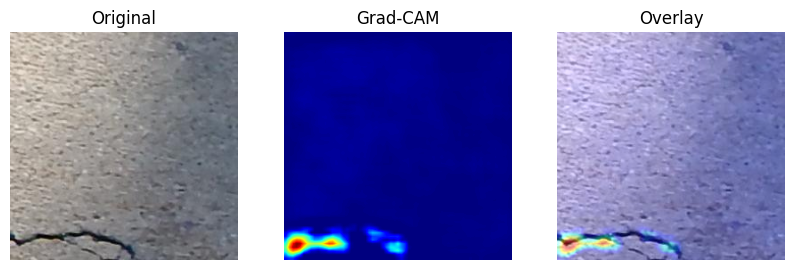

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9872.jpg
Prob: 0.36640713


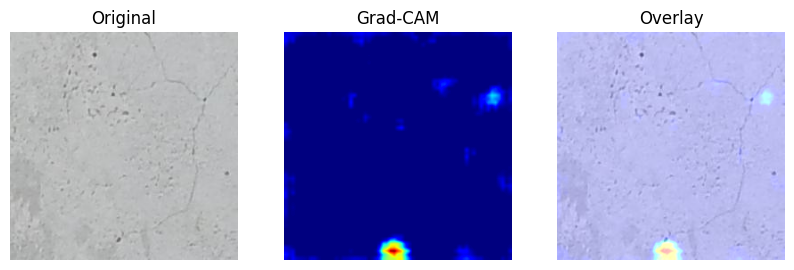

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7355.jpg
Prob: 0.31317899


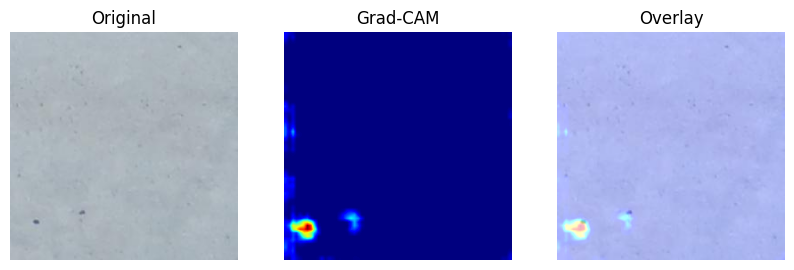

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9584.jpg
Prob: 1.00000000


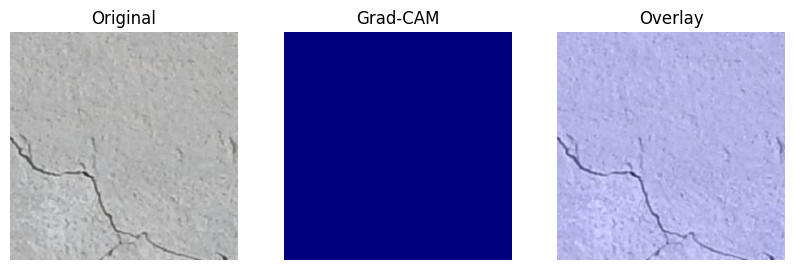

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9662.jpg
Prob: 0.18457766


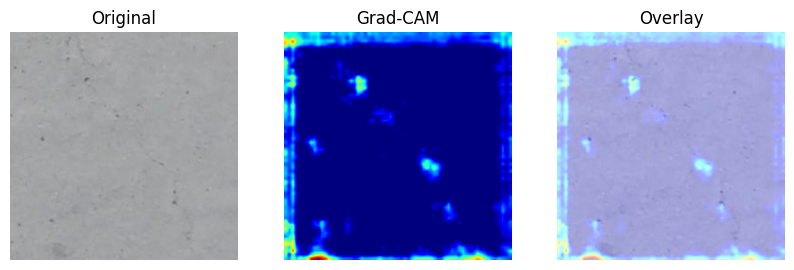

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7049.jpg
Prob: 0.90523899


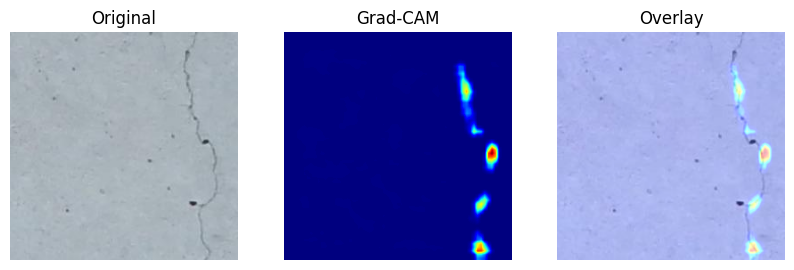

In [8]:
# Plot grad-cam for example images
model_name = "Model_V2_CNN_SGD"
model = load_model(f"{MODEL_DIR}{model_name}.h5")

TARGET_SIZE = (256, 256)

for example_path in os.listdir(EXAMPLES_DIR):
    plot_grad_cam(EXAMPLES_DIR + example_path, model, target_size=TARGET_SIZE, verbose=False)

# HyperParameter Tuning for Version 3


To address the issues identified in the second version of the model, I will make a few changes:
- Increase first kernel size to 5 instead of 3.
    - Allow the model to have more spatial contextual information in the first feature generation layer
- Apply LeakyReLU after batch normalization
    - This will enable large negative weights to still have a slight effect on the output of the node.
    - LeakyReLU take a constant, alpha, and multiplies it with the negative value instead of converting it to zero.
    - Since many of the hot spots weren’t cracks, I wanted to see if there was something going on with the negative values being a cause of this
- Applied small kernel regulation of L2 to the layers.
    - Attempt to reduce the overfitting that was observed in the baseline model
- Average Pooling instead of Max Pooling <sup>[6]</sup>
    - Smooth out the images instead of harsher contrast. Since the cracks are dark, I suspected the cracks were being washed out. Min Pooling could have also been an option. <sup>[8]</sup>
- Decreased Classification Dense Layer to 16 neurons
    - Attempted to reduce the overfitting that was observed in the baseline model
    - Added regularization to this layer as well.

I will talk about the results versus the expectations in the GradCam visualization section for this model


In [ ]:
# Define CNN model
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D,
    BatchNormalization,
    Dense,
    Dropout,
    SpatialDropout2D,
    GlobalAveragePooling2D,
    Rescaling,
    LeakyReLU,
)
from keras import losses, metrics
from keras.regularizers import l2

L2 = l2(0.00001)  # Constant for L2 regularization so I stop having inconsistent values
ALPHA = 0.1  # Constant for LeakyReLU alpha value
DROPOUT = 0.1

model_V3 = Sequential(
    [
        Rescaling(1.0 / 255, input_shape=(256, 256, 3)),  #
        ## LAYER 1
        Conv2D(
            32,
            (5, 5),
            padding="same",  # Changed back to same because clearly I don't understand how edge artifacts work
            #input_shape=(256, 256, 3),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False, # no bias because I have batch norm
        ),  # increased L2 regularization
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),  # Changed to spacial dropout to dropout entire feature maps
        Conv2D(
            32,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        AveragePooling2D((2, 2)),
        ## LAYER 2
        Conv2D(
            64,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),  # new dropout layer to help prevent overfitting
        Conv2D(
            64,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        AveragePooling2D((2, 2)),
        ## LAYER 3
        Conv2D(
            128,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),
        Conv2D(
            128,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        Conv2D(
            256,
            (3, 3),
            padding="same",
            # dilation_rate=(2, 2),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        Conv2D(
            256,
            (3, 3),
            padding="same",
            dilation_rate=(2, 2),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # Conv2D(
        #     512,
        #     (3, 3),
        #     padding="same",
        #     kernel_regularizer=L2,
        # ),
        # LeakyReLU(ALPHA),
        ### Classification layerss
        GlobalAveragePooling2D(),
        Dropout(DROPOUT),  # good for dropout ? or messes up map?
        Dense(16, kernel_regularizer=L2),
        LeakyReLU(ALPHA),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

# Compile the model
from keras.optimizers import Adam, SGD

model_V3.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9),
    loss=losses.BinaryCrossentropy(label_smoothing=0.05),  # "binarycrossentropy", # Make the less loss confident to help with gradients
    metrics=[
        "accuracy",
        "AUC",
    ],  # "AUC"
)
model_V3.summary()

# checkpoint manager
CHECKPOINT_DIR = MODEL_DIR + "checkpoints/"
checkpoint = tf.train.Checkpoint(
    baseline_model=baseline_model,
    model_V3=model_V3,
)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 conv2d_37 (Conv2D)          (None, 256, 256, 32)      2400      
                                                                 
 batch_normalization_9 (Bat  (None, 256, 256, 32)      128       
 chNormalization)                                                
                                                                 
 leaky_re_lu_16 (LeakyReLU)  (None, 256, 256, 32)      0         
                                                                 
 conv2d_38 (Conv2D)          (None, 256, 256, 32)      9216      
                                                                 
 batch_normalization_10 (Ba  (None, 256, 256, 32)      128       
 tchNormalization)                                    

In [ ]:
# Trian on subset of training data
history = model_V3.fit(
    train_ds,
    epochs=50, 
    batch_size=64,
    validation_data=val_ds,
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)


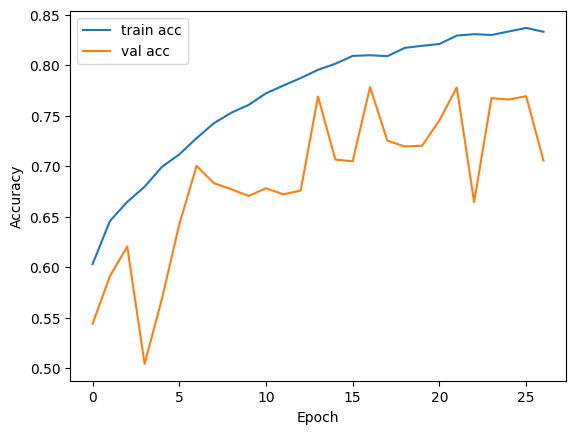

In [54]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [55]:
# Save the model
model_name = "Model_V3_CNN_SGD"
print(f"Model Name: {model_name}")
model_V3.save(f"{MODEL_DIR}{model_name}.h5")

import pickle

with open(f"{MODEL_DIR}{model_name}_history.pkl", "wb") as f:
    pickle.dump(history.history, f)

# Capture model summary
summary_buffer = StringIO()
model_V3.summary(print_fn=lambda x: summary_buffer.write(x + '\n'))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {model_V3.input_shape[1:]}\n")
    f.write(f"Total Parameters: {model_V3.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: Model_V3_CNN_SGD


/home/megarnol/projects/MSDS_Notes_Playground/.venv/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### GradCAM Evaluation of Version 3

This model performed better on the test dataset than the original baseline model. Looking at the visualizations, we can see that it was able to identify cracks in the global context along with removing the importance of craters on the classification.

| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
|Model Baseline| ~0.85 | 0.780 | 0.773 |
|Version 2 | ~0.85 | 0.721 | 0.699 |
|Version 3  | ~0.86|0.795|0.771|


We see that on long deep cracks (Image 3), the model now takes the entire line into consideration and highlights it. This is a significant improvement from the baseline model. I’m much happier with the results, althought the highlighting could be more targeted with less of a border around the crack, but I think that could be corrected with better spatial labeling and more detailed predictions with bounding boxes. I will discuss this in the future work section

The model still doesn’t perform well on the small cracks (Image 1 - hard to see crack runs vertical). The model didn’t identify this image as having a crack and the heat map is the same as the second image with no crack, only craters in the bottom right. Image 14 also has a small crack, but is easier to see with the naked eye. The model was able to highlight a significant enough portion of this crack to predict it correctly, as probability of 82 percent.

Also, the model now rarely highlights craters as significant features. There are a few instances where a single crater is highlighted, but there are several (4,5, 8, 12) very cratery images that were predicted to be uncracked successfully. 

The areas to be improved are prominent in image 13, where the model was very confused on what was a critical feature. Despite highlighting the crack with confidence the heatmap wasn’t interpretable to myself.

Overall, this model is significantly better than the original baseline model with regard to explainability, highlighting entire cracks, and negligible emphasis on craters. Because of this, despite the metrics not being a significant improvement, this model is much more usable and explainable in the real world.

To attempt to further improve upon this, I will add data augmentation layers to the Version 3 network to see if there is improvement from a more diversified and random dataset. 


Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9992.jpg
Prob: 0.25502968


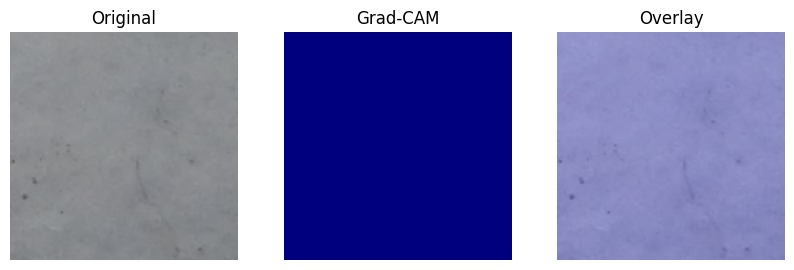

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/14.jpg
Prob: 0.29804516


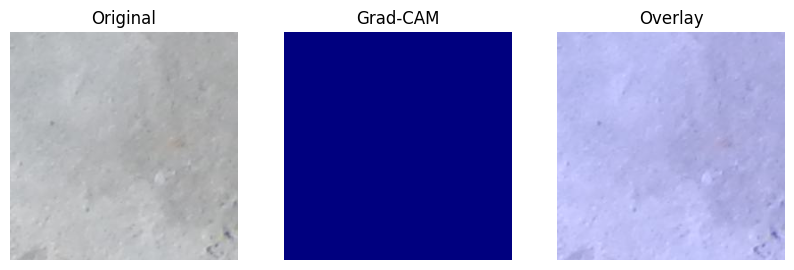

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5795.jpg
Prob: 0.99996734


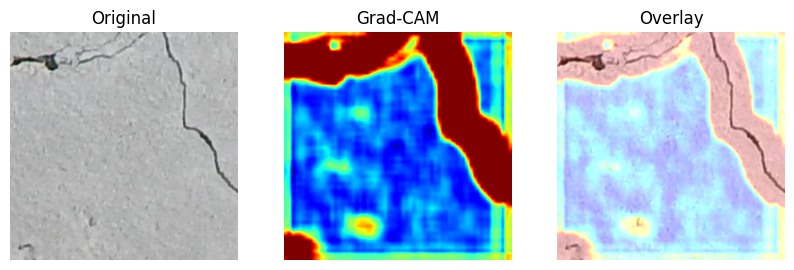

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1910.jpg
Prob: 0.37297833


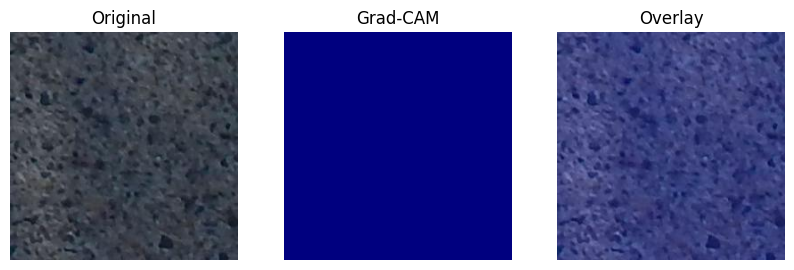

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/6215.jpg
Prob: 0.23385623


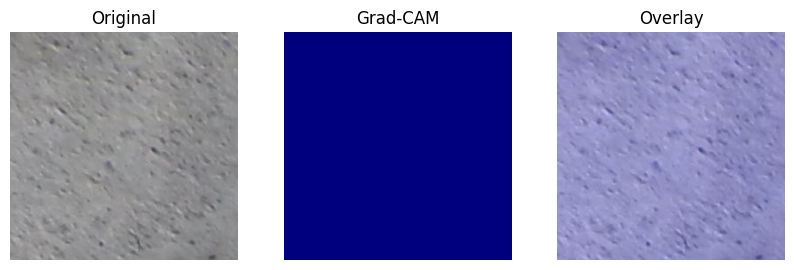

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5306.jpg
Prob: 0.25005513


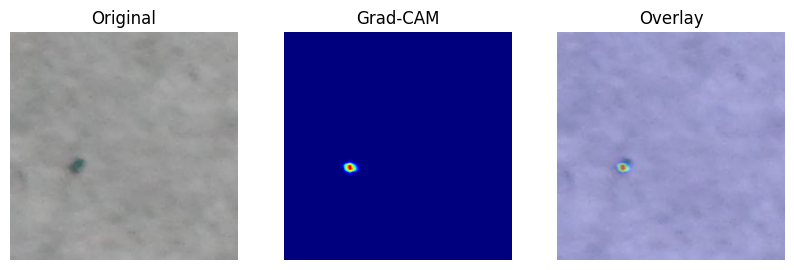

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5281.jpg
Prob: 0.99829489


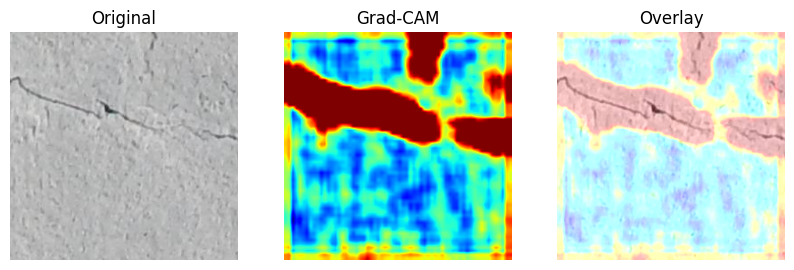

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/1090.jpg
Prob: 0.12139180


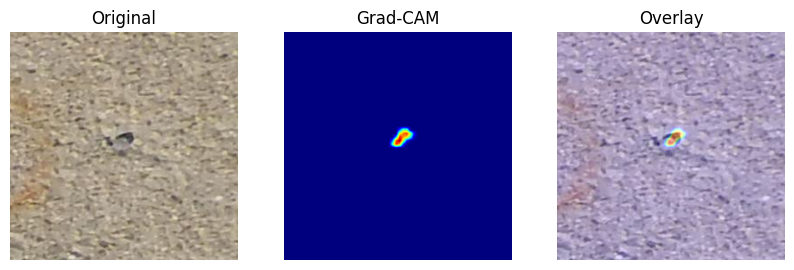

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5923.jpg
Prob: 0.21815911


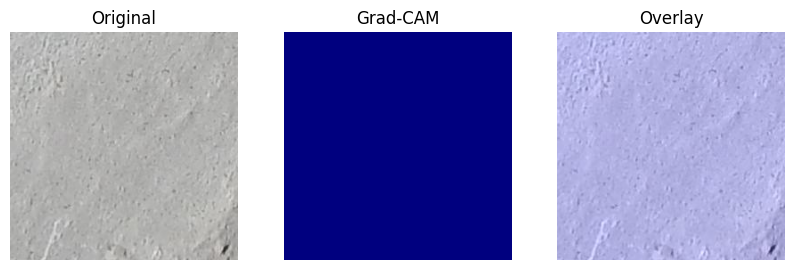

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/5292.jpg
Prob: 0.24076895


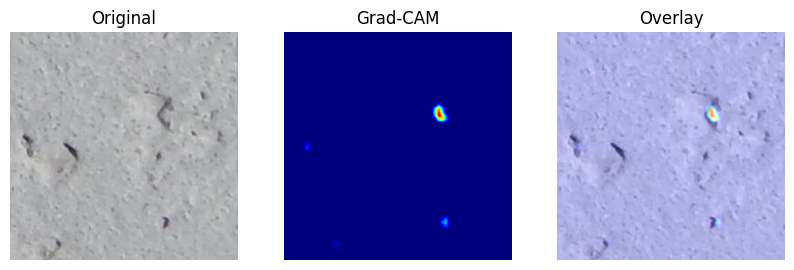

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/4622.jpg
Prob: 0.97978514


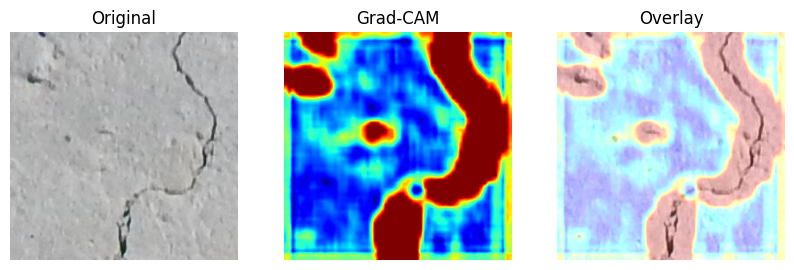

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/448.jpg
Prob: 0.06217940


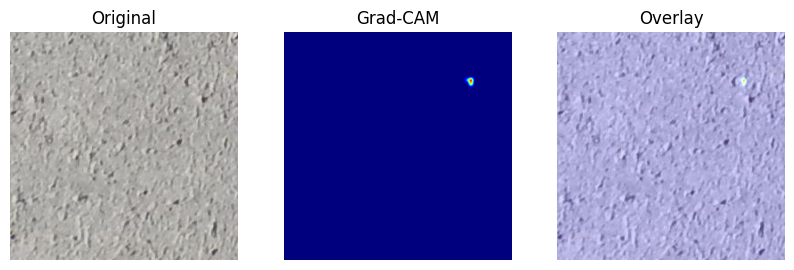

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7773.jpg
Prob: 0.99347937


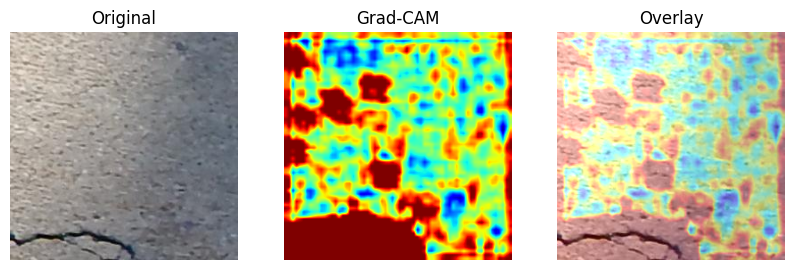

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9872.jpg
Prob: 0.82168090


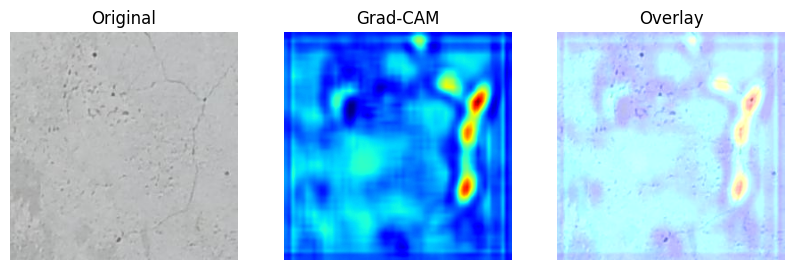

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7355.jpg
Prob: 0.31642345


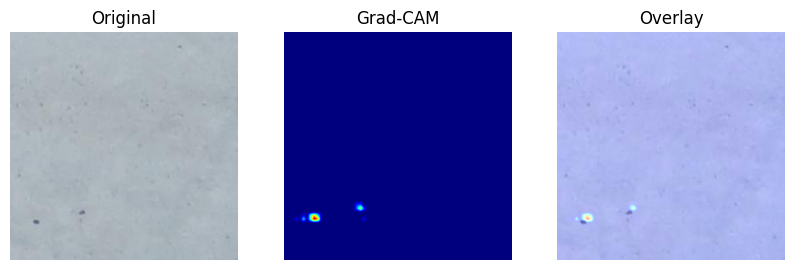

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9584.jpg
Prob: 0.99992788


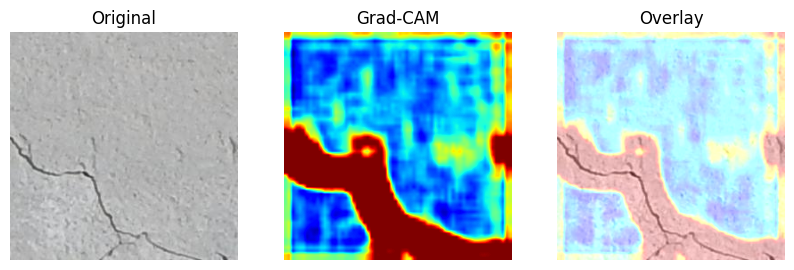

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/9662.jpg
Prob: 0.25288871


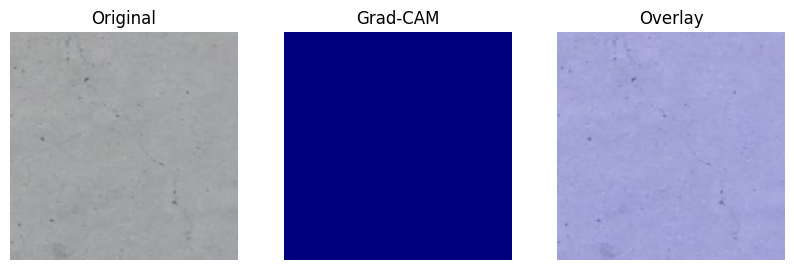

Path: /home/megarnol/projects/MSDS_Notes_Playground/DTSA 5511 Deep Learning/Final/data/examples_subset/7049.jpg
Prob: 0.99845135


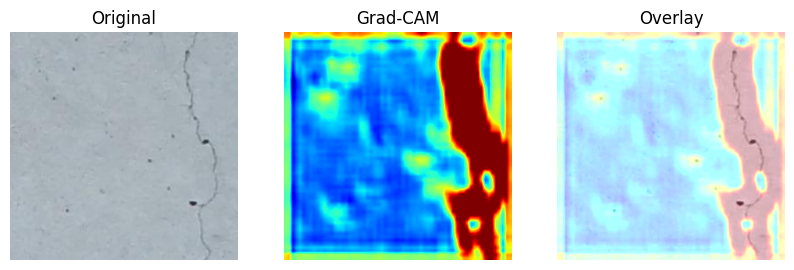

In [6]:
model_name = "Model_V3_CNN_SGD"
model = load_model(f"{MODEL_DIR}{model_name}.h5")
TARGET_SIZE = (256, 256)


for example_path in os.listdir(EXAMPLES_DIR):
    plot_grad_cam(EXAMPLES_DIR + example_path, model, target_size=TARGET_SIZE)

# Final Model with Data Augmentation

To help the generalization of the model and reduce overfitting, I will add data augmentation layers to the best performing model<sup>[7]</sup>. The data augmentation that I added include the following:
1. Random Constrast, 2%
2. Random Flip, horizontal and vertical
3. Random Rotation, +- 36 degrees
    1. I think this may have caused some issues with cracks in corners being removed
4. Random Zoom, 10%
    1. I think this may have caused some issues with cracks on the edges being removed
5. Random Translation, 10%
    1. I think this may have caused some issues with cracks on the edges being removed
6. GaussianNoise, std = 0.01

| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
|Model Baseline| ~0.85 | 0.780 | 0.773 |
|Version 2 | ~0.85 | 0.721 | 0.699 |
|Version 3  | ~0.86|0.795|0.771|
|Augmented Version 3 |~0.77|0.713|0.704|


Overall, this model performed worse than the non-augmented version 3 model. I think this is due to some of the zooms, translations, and rotations that are performed in the augmentation step. If there are images that had cracks only along the edges and not centered, then this may have removed them or made them so small that the model didn’t identify them. To determine if this is the case, future work can get a subset of images that V3 identified correctly (either cracked or uncracked) and V3 with data augmentation messed up to see if this hypothesis is correct. I also don’t have much experience with data augmentation, so I tried to have reasonable values, but these are all hyperparameters that can be tuned in future work. It should be noted though, that the training and validation accuracy aligned the closest out of any model. So data augmentation wasn’t a complete bust, as this does appear to help with the overfitting issues I’ve been having throughout this project. 


In [18]:
# Define simple CNN model
from keras.models import Sequential
from keras.layers import (
    Conv2D,
    MaxPooling2D,
    AveragePooling2D,
    BatchNormalization,
    Dense,
    Dropout,
    SpatialDropout2D,
    GlobalAveragePooling2D,
    Rescaling,
    LeakyReLU,
    RandomContrast,
    RandomFlip,
    RandomRotation,
    RandomZoom,
    RandomTranslation,
    GaussianNoise,
)
from keras import losses, metrics
from keras.regularizers import l2

L2 = l2(0.00001)  # Constant for L2 regularization so I stop having inconsistent values
ALPHA = 0.1  # Constant for LeakyReLU alpha value
DROPOUT = 0.1


model_V3_Aug = Sequential(
    [
        Rescaling(1.0 / 255, input_shape=(256, 256, 3)),
        # Data Augmentation Layers - !!only active during training!!
        RandomContrast(factor=0.02),  # Adjust contrast by ±10%
        RandomFlip(mode="horizontal_and_vertical"),
        RandomRotation(factor=0.1),  # Rotate images by ±10% of 360 degrees
        RandomZoom(height_factor=0.1, width_factor=0.1),  # Zoom in/out by ±10%
        RandomTranslation(
            height_factor=0.1, width_factor=0.1
        ),  # Translate images by ±10% of height/width
        GaussianNoise(
            stddev=0.01
        ),  # Add Gaussian noise with standard deviation of 0.01
        ## CNN LAYERS
        ## LAYER 1
        Conv2D(
            32,
            (5, 5),
            padding="same",  # Changed back to same because clearly I don't understand how edge artifacts work
            # input_shape=(256, 256, 3),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,  # no bias because I have batch norm
        ),  # increased L2 regularization
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),  # Changed to spacial dropout to dropout entire feature maps
        Conv2D(
            32,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        AveragePooling2D((2, 2)),
        ## LAYER 2
        Conv2D(
            64,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),  # new dropout layer to help prevent overfitting
        Conv2D(
            64,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        AveragePooling2D((2, 2)),
        ## LAYER 3
        Conv2D(
            128,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # SpatialDropout2D(DROPOUT),
        Conv2D(
            128,
            (3, 3),
            padding="same",
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        Conv2D(
            256,
            (3, 3),
            padding="same",
            # dilation_rate=(2, 2),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        Conv2D(
            256,
            (3, 3),
            padding="same",
            dilation_rate=(2, 2),
            kernel_regularizer=L2,
            activation=None,
            use_bias=False,
        ),
        BatchNormalization(),
        LeakyReLU(ALPHA),
        # Conv2D(
        #     512,
        #     (3, 3),
        #     padding="same",
        #     kernel_regularizer=L2,
        # ),
        # LeakyReLU(ALPHA),
        ### Classification layerss
        GlobalAveragePooling2D(),
        Dropout(DROPOUT),  # good for dropout ? or messes up map?
        Dense(16, kernel_regularizer=L2),
        LeakyReLU(ALPHA),
        Dense(1, activation="sigmoid", dtype="float32"),
    ]
)

# Compile the model
from keras.optimizers import Adam, SGD

model_V3_Aug.compile(
    optimizer=SGD(learning_rate=0.01, momentum=0.9),
    loss=losses.BinaryCrossentropy(
        label_smoothing=0.05
    ),  # "binarycrossentropy", # Make the less loss confident to help with gradients
    metrics=[
        "accuracy",
        "AUC",
    ],  # "AUC"
)
model_V3_Aug.summary()

# checkpoint manager
CHECKPOINT_DIR = MODEL_DIR + "checkpoints/"
checkpoint = tf.train.Checkpoint(
    #baseline_model=baseline_model,
    #model_V3=model_V3,
    model_V3_Aug=model_V3_Aug,
)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 random_contrast_1 (RandomC  (None, 256, 256, 3)       0         
 ontrast)                                                        
                                                                 
 random_flip_1 (RandomFlip)  (None, 256, 256, 3)       0         
                                                                 
 random_rotation_1 (RandomR  (None, 256, 256, 3)       0         
 otation)                                                        
                                                                 
 random_zoom_1 (RandomZoom)  (None, 256, 256, 3)       0         
                                                                 
 random_translation_1 (Rand  (None, 256, 256, 3)      

In [ ]:
history = model_V3_Aug.fit(
    train_ds,
    epochs=75, 
    batch_size=64,
    validation_data=val_ds,
    callbacks=[EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)]
)

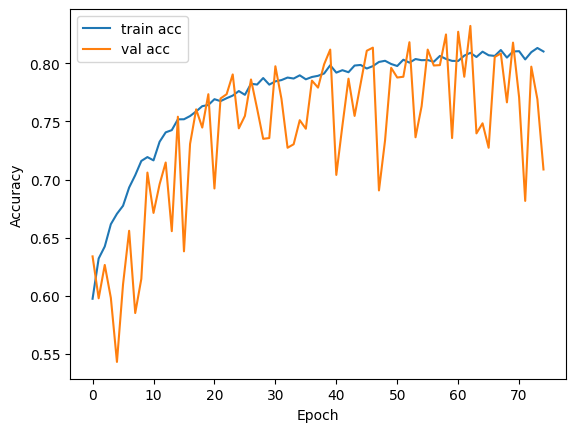

In [20]:

plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [22]:
# Save the model
model_name = "Model_V3_CNN_SGD_Augmentation_Layers"
print(f"Model Name: {model_name}")
model_V3_Aug.save(f"{MODEL_DIR}{model_name}.h5")

import pickle

with open(f"{MODEL_DIR}{model_name}_history.pkl", "wb") as f:
    pickle.dump(history.history, f)

# Capture model summary
summary_buffer = StringIO()
model_V3_Aug.summary(print_fn=lambda x: summary_buffer.write(x + '\n'))
model_summary_str = summary_buffer.getvalue()
summary_buffer.close()

# Write to file
with open(f"{MODEL_DIR}{model_name}_performance.txt", "w") as f:
    f.write(f"Model Name: {model_name}\n")
    f.write(f"Input Shape: {model_V3_Aug.input_shape[1:]}\n")
    f.write(f"Total Parameters: {model_V3_Aug.count_params() // 1000}K\n")
    f.write(f"Optimizer: Adam\n")
    f.write(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
    f.write(f"Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
    f.write("Model Summary:\n")
    f.write(model_summary_str)

Model Name: Model_V3_CNN_SGD_Augmentation_Layers


# Submission Retrieval

In [ ]:
# Get Test Dataset and Create Predictions CSV for Kaggle Submission
test_dataset = tf.keras.utils.image_dataset_from_directory(
    TEST_DIR,
    labels=None,
    image_size=(256, 256),
    batch_size=32,
    shuffle=False,
)


model_name = "Baseline_CNN_SGD"
model = tf.keras.models.load_model(f"{MODEL_DIR}{model_name}.h5")

test_df = get_test_predictions_df(model, test_dataset, threshold=0.5, batch_size=32)
print(test_df.head())
CSV_PATH = DATA_DIR + "submissions/"

test_df.to_csv(f"{CSV_PATH}{model_name}_test_predictions.csv", index=False)

# Results and Conclusion

With this project, I started with a standard baseline CNN model that I wanted to troubleshoot and build upon. The first model had several CNN blocks with normalization and a classification layer. This model overfit, identified non-relevant features (craters), and didn't use global context, which led to the second model. The second model also struggled global features, but the non-relevant highlighting appears to be slightly better. This led to the third model which was the best model of all. This third model was able to identify the entirity of the crack, not get distracting by confounding factors, such as craters, and also performed the best on the test dataset.

Overall, the main alterations to the baseline CNN model was the addition of LeakyReLU<sup>[10]</sup>, increased first kernel size, added CNN regularization, used Average pooling instead of max pooling<sup>[8]</sup>, and added the dilation rate<sup>[9]</sup> on the last layer. Overall, these changes enabled to model to use global cues and focus only on the cracks themselves. This enables the model to be explainable with the use of GradCAM to highlight what spatial areas of the 2D image are providing the most positive indicators for the classification head.

To further improve the performance, I attempted data augmentation<sup>[7]</sup>; however, I think I was too aggressive and ended up randomly augmenting the data such that there was too much noise and the model wasn’t able to learn the important features of a crack.

Ultimately, additional work can be done to improve the performance of the training and model itself. I would recommend labeling the training data with the spatially critical information, like bounding boxes. This would help prevent the model from learning on confounding factors instead of the actual crack information (example of confounding factor in this data is is very cratered images). 

Having an explainable accurate model would help automate the inspection of critical components to identify failures before they become catestrophic. Models like this could augment human inspectors and decrease the probability of quality/inspection escapes. 

| Model Description | Validation Accuracy | Public Kaggle Accuracy | Private Kaggle Accuracy |
|-------------------|---------------------|--------------------|---------------------|
| Model Baseline| ~0.85 | 0.780 | 0.773 |
|Version 2 | ~0.85 | 0.721 | 0.699 |
| Versionn 3  | ~0.86|0.795|0.771|
|Augmented Version 3 |~0.77|0.713|0.704|


# Future Work

Below is a list of ideas to try for future work. They include better labeling and training practices:

- Better labels with bounding boxes or segmentation masks. This would enable the model to learn more spatially relevant features and improve the model's performance and training
- Additional Data augmentation techniques to create more diverse training images and examples. Also, to hyperparameter tune and ensure the agumentation isn't too aggressive or noisy.
- Output of bounding boxes instead of inference based on the last CNN layer's output in the GradCAM visualization. Having the spatial information in the training data and outputing the spatial information would improve the model's explainability and interpretability. I also hypothesize that this would improve the model's training and performance.


# Discussion

Throughout the project, there were several isntances of confusion and as I answered the questions for myself, I decided to document them here. Below are some of the things that seemed counter intuitive and required additional investigation.

- Why did the grad-cam visualization not highlight obvious features in the images that a human would use to classify the images?
    - Something about the activation of the final CNN layers were very confident in the recommendation. These were the only instances where there wasn't sufficient gradient to plot a heat map, as the standard deviation of gradients couldn't be scaled in a way that makes sense

- Early on in the GradCAM visualizations, some of the cracks were highlighted in red and some were highlighted in blue. I implemented a heuristic check to differentiate between the two and ensure the plots were consistent, but why was this check necessary for consistent red/blue coloring?
    - My hypothesis is that the model is treating thick heavy lines differently than thin light lines differently than no lines. Because of this, the grad-cam visualization is highlighting the different features. 

- Why did the Data Augmentation model perform worse on the test set than the non-augmented model?
    - Maybe the augmentations were too aggressive and distorted the images too much. Or maybe the augmentations introduced artifacts that confused the model. The data augmentation techniques should be hyperparameter tuned as well. This will be in the section for future work

These questions can also be added to the future work section to setup and run experiments to increase the confidence of the response.

Overall, I was able to create a model that could classify cracks, and with some post-processing, could highlight the critical features within the original image that contributed to the final classification. This created an explainable model that cna increase the confidence of the final users, especially on critical tasks like crack detection.

# References

[1]
“Crack Detection: Image Classification,” @kaggle, 2025. https://www.kaggle.com/competitions/crack-identification-ce784a-2020-iitk/data (accessed Sep. 30, 2025).


[2]
D.-K. Kim, “Grad-CAM: A Gradient-based Approach to Explainability in Deep Learning,” Medium, Feb. 17, 2025. https://medium.com/@kdk199604/grad-cam-a-gradient-based-approach-to-explainability-in-deep-learning-871b3ab8a6ce (accessed Aug. 17, 2025).
‌

[3]
K.Team, “Keras documentation: Grad-CAM class activation visualization,” Keras.io, 2020. https://keras.io/examples/vision/grad_cam/ (accessed Sep. 30, 2025).
‌

[4]
R. R. Selvaraju, M. Cogswell, A. Das, Ramakrishna Vedantam, D. Parikh, and D. Batra, “Grad-CAM: Visual Explanations from Deep Networks via Gradient-Based Localization,” International Journal of Computer Vision, vol. 128, no. 2, pp. 336–359, Oct. 2019, doi: https://doi.org/10.1007/s11263-019-01228-7.
‌

[5]
Amit Kharche, “Grad-CAM and Explainability in Computer Vision: A Complete Guide with Code and Insights,” Medium, Aug. 02, 2025. https://medium.com/@amitkharche14/grad-cam-and-explainability-in-computer-vision-a-complete-guide-with-code-and-insights-a505345de8fc (accessed Sep. 30, 2025).
‌

[6]
L. Sun, Z. Chen, Q. M. J. Wu, H. Zhao, W. He, and X. Yan, “AMPNet: Average- and Max-Pool Networks for Salient Object Detection,” IEEE Transactions on Circuits and Systems for Video Technology, vol. 31, no. 11, pp. 4321–4333, Nov. 2021, doi: https://doi.org/10.1109/tcsvt.2021.3054471.


‌[7]
Data augmentation, “Data augmentation,” TensorFlow, 2024. https://www.tensorflow.org/tutorials/images/data_augmentation (accessed Sep. 27, 2025).


[8]
Madhushree Basavarajaiah, “Maxpooling vs minpooling vs average pooling,” Medium, Feb. 08, 2019. https://medium.com/@bdhuma/which-pooling-method-is-better-maxpooling-vs-minpooling-vs-average-pooling-95fb03f45a9 (accessed Sep. 30, 2025).


[9]
Everton Gomede, PhD, “Expanding Vision, Enhancing Detail: Evaluating the Impact of Dilation Rates on CNN Performance in…,” Medium, May 07, 2024. https://blog.devgenius.io/expanding-vision-enhancing-detail-evaluating-the-impact-of-dilation-rates-on-cnn-performance-in-2f37fb7a0156 (accessed Sep. 30, 2025).
‌

[10]
PyTorch Contributors, “LeakyReLU,” Pytorch.org, 2025. https://docs.pytorch.org/docs/stable/generated/torch.nn.LeakyReLU.html (accessed Oct. 01, 2025).
‌
‌
‌